In [2]:
import pandas as pd

df_processed = pd.read_csv('C:\\Users\\ssen\\Documents\\FlexKI\\EngineHealthPred\\ChallengeData\\train_processed.csv')
unit_data = {}
for unit_num, unit_df in df_processed.groupby('unit_number'):
    unit_df.set_index('time_cycles', inplace=True)
    unit_data[unit_num] = unit_df
print(unit_data[11].head())

             unit_number  operational_setting_1  operational_setting_2  \
time_cycles                                                              
1                     11                25.0011                 0.6200   
2                     11                35.0058                 0.8402   
3                     11                42.0026                 0.8400   
4                     11                42.0061                 0.8407   
5                     11                 0.0009                 0.0002   

             operational_setting_3  sensor_measurement_1  \
time_cycles                                                
1                             80.0                462.54   
2                             60.0                449.44   
3                             40.0                445.00   
4                             40.0                445.00   
5                            100.0                518.67   

             sensor_measurement_2  sensor_measurement_3  sen

In [3]:
import pandas as pd

# Assuming df_processed is already loaded as before
# The columns 'unit_number', 'time_cycles' and 'RUL' are excluded from these calculations

# Create delta features
delta_columns = [f"delta_{col}" for col in df_processed.columns if col not in ['unit_number', 'time_cycles', 'RUL']]
for col, delta_col in zip(df_processed.columns, delta_columns):
    if col not in ['unit_number', 'time_cycles', 'RUL']:
        df_processed[delta_col] = df_processed.groupby('unit_number')[col].diff().fillna(0)

# Normalize data - standardization
sensor_cols = [col for col in df_processed.columns if col not in ['unit_number', 'time_cycles', 'RUL']]
for col in sensor_cols:
    mean_std = df_processed.groupby('unit_number')[col].transform(lambda x: (x - x.mean()) / x.std())
    df_processed[col] = mean_std

print(df_processed.head())


   unit_number  time_cycles  operational_setting_1  operational_setting_2  \
0            1            1              -1.057976              -1.153929   
1            1            2              -1.762560              -1.997929   
2            1            3               0.702489               0.839506   
3            1            4              -0.353731               0.367839   
4            1            5               1.195928               0.840858   

   operational_setting_3  sensor_measurement_1  sensor_measurement_2  \
0              -1.006440              0.743114              0.806178   
1               1.565894              1.913430              1.841628   
2               0.279727             -0.821918             -0.521105   
3              -1.649523              0.827667              0.885200   
4              -0.363357             -0.997347             -0.681872   

   sensor_measurement_3  sensor_measurement_4  sensor_measurement_5  ...  \
0              0.891179     

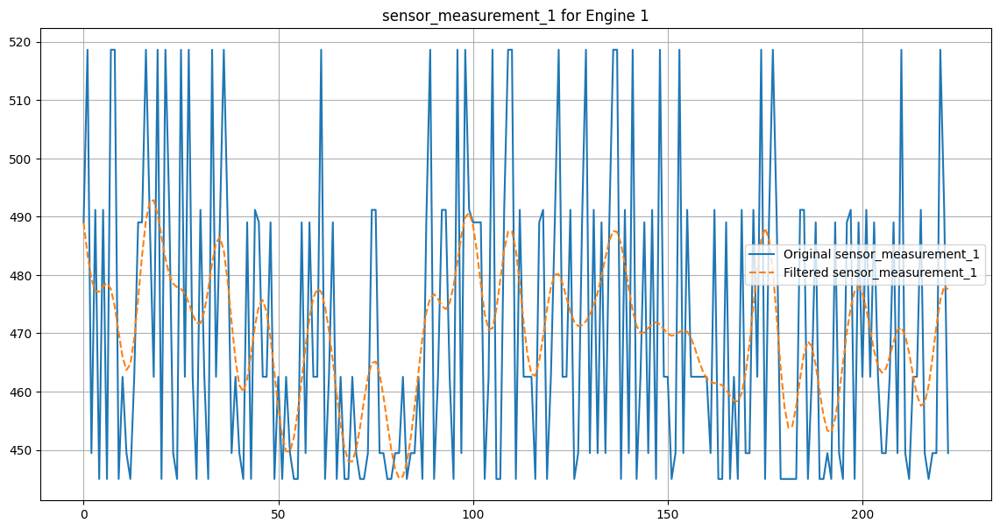

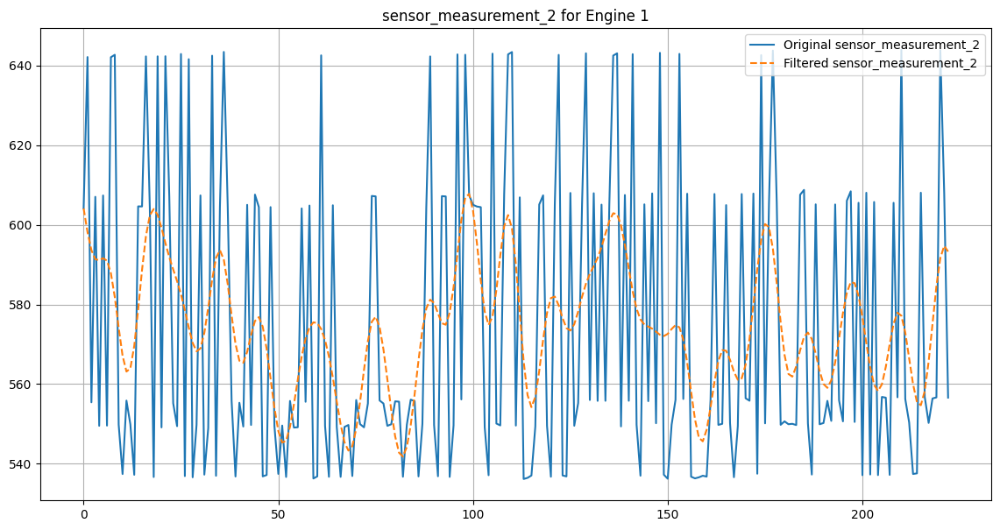

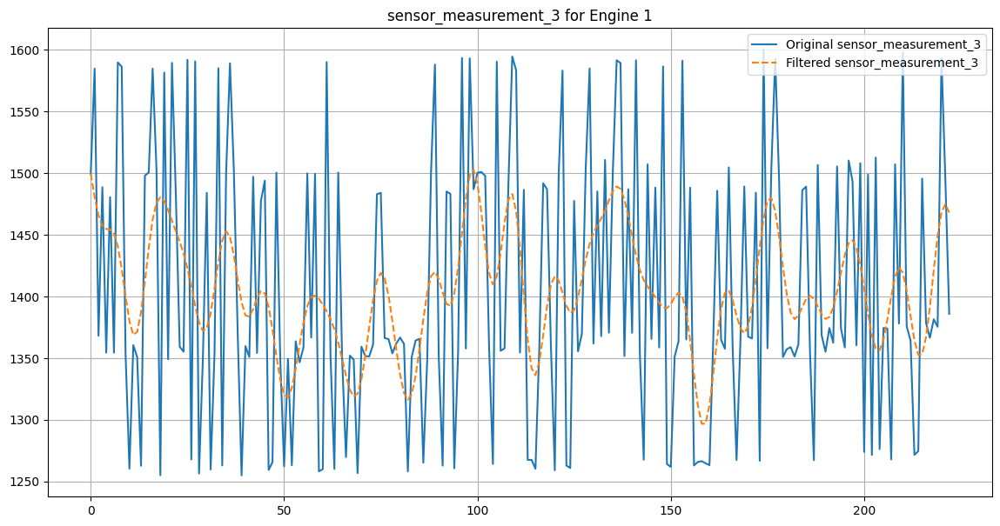

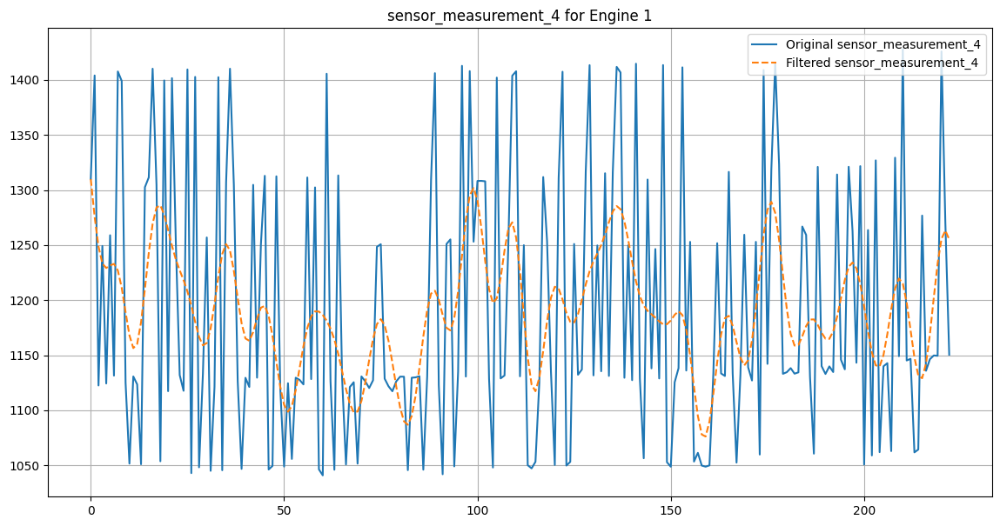

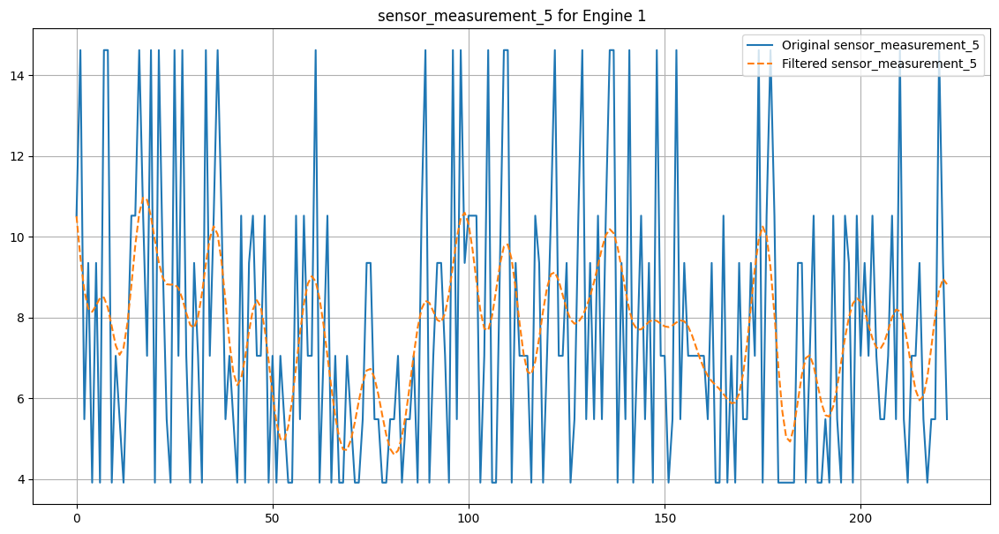

...

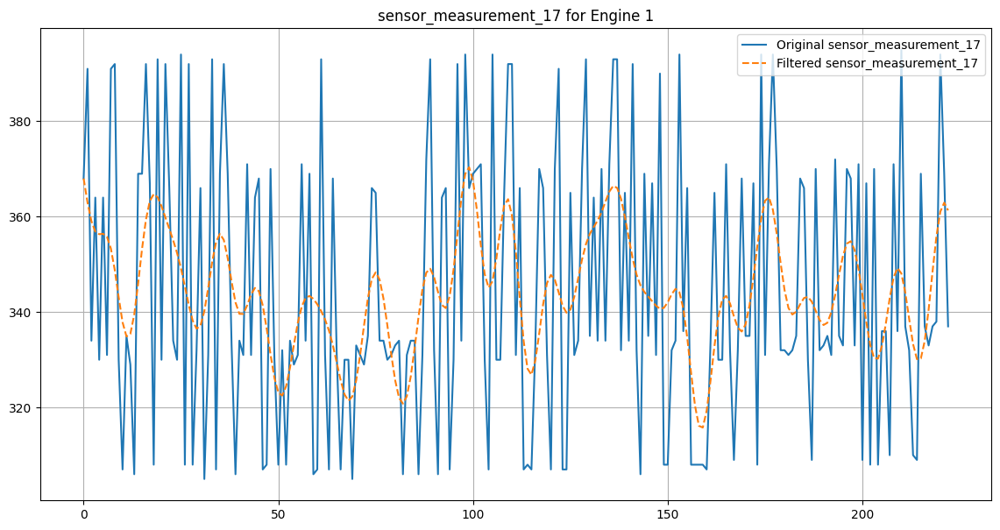

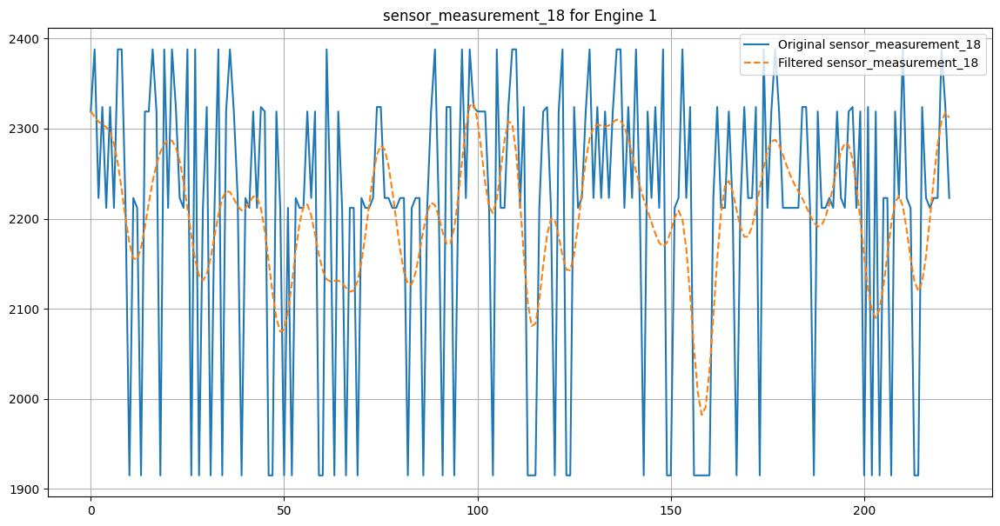

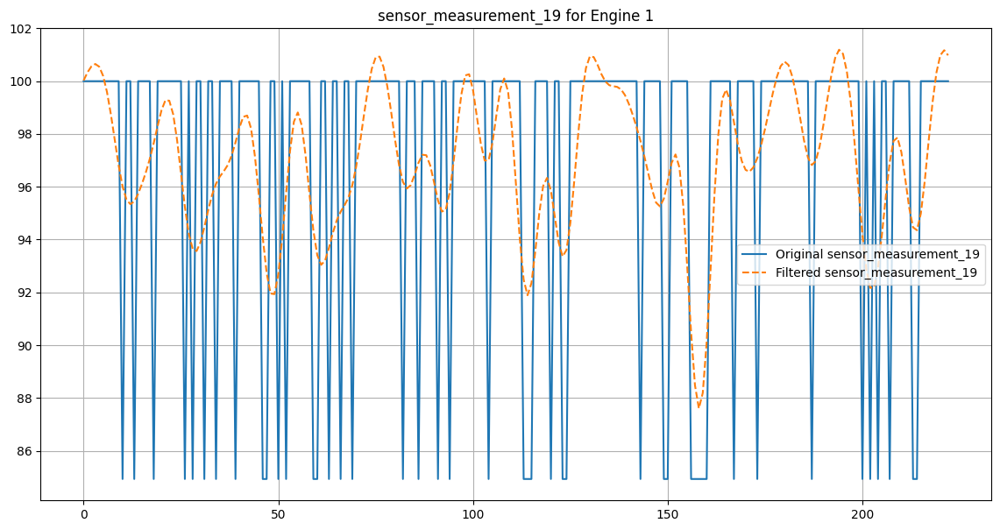

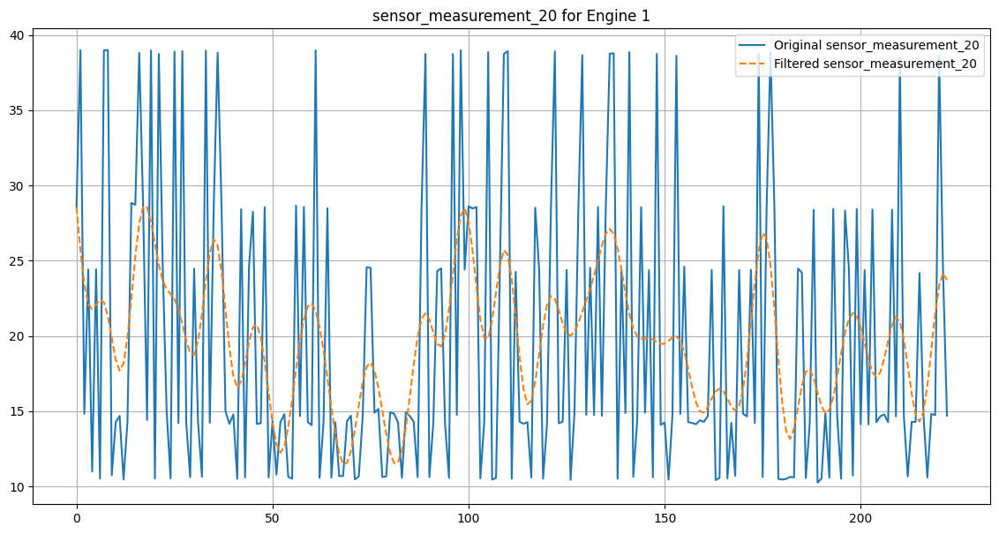

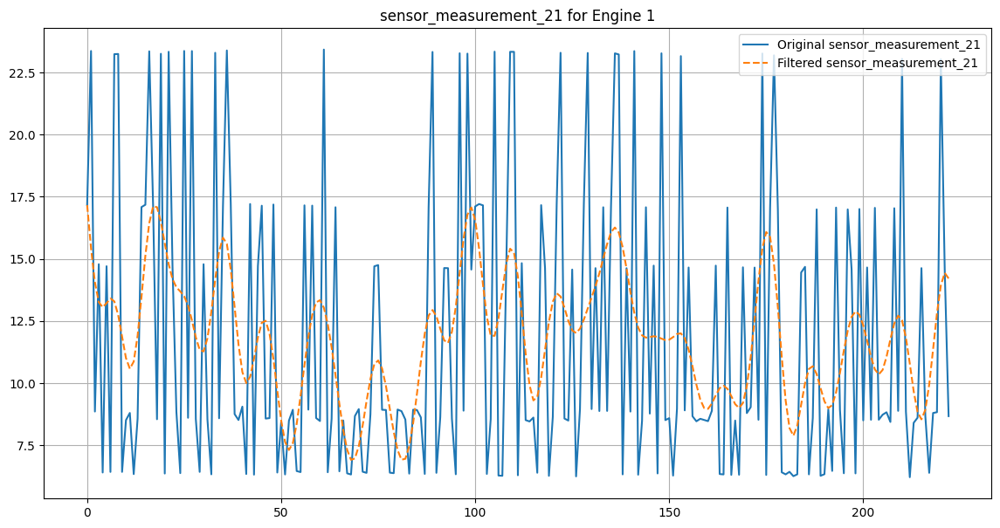

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, lfilter, filtfilt

# Define the Butterworth low-pass filter function
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y

# Load the data
df_processed = pd.read_csv('C:\\Users\\ssen\\Documents\\FlexKI\\EngineHealthPred\\ChallengeData\\train_processed.csv')

# Create a new dataframe to store filtered data
df_filtered = df_processed.copy()

# Define the sampling frequency (assuming the data is sampled at 1 Hz, adjust if needed)
fs = 1.0

# Define the cutoff frequency for the low-pass filter (adjust based on your data)
cutoff = 0.1

# Iterate over each sensor and apply the low-pass filter for all engines
sensor_columns = [col for col in df_processed.columns if 'sensor_measurement' in col]
for sensor in sensor_columns:
    df_filtered[sensor] = butter_lowpass_filter(df_processed[sensor].values, cutoff, fs)

# Plot the original and filtered data for a specified engine unit
engine_unit_number = 1
df_engine_original = df_processed[df_processed['unit_number'] == engine_unit_number]
df_engine_filtered = df_filtered[df_filtered['unit_number'] == engine_unit_number]

for sensor in sensor_columns:
    plt.figure(figsize=(14, 7))
    plt.plot(df_engine_original[sensor], label='Original ' + sensor)
    plt.plot(df_engine_filtered[sensor], label='Filtered ' + sensor, linestyle='dashed')
    plt.title(f'{sensor} for Engine {engine_unit_number}')
    plt.legend()
    plt.grid(True)
    plt.show()


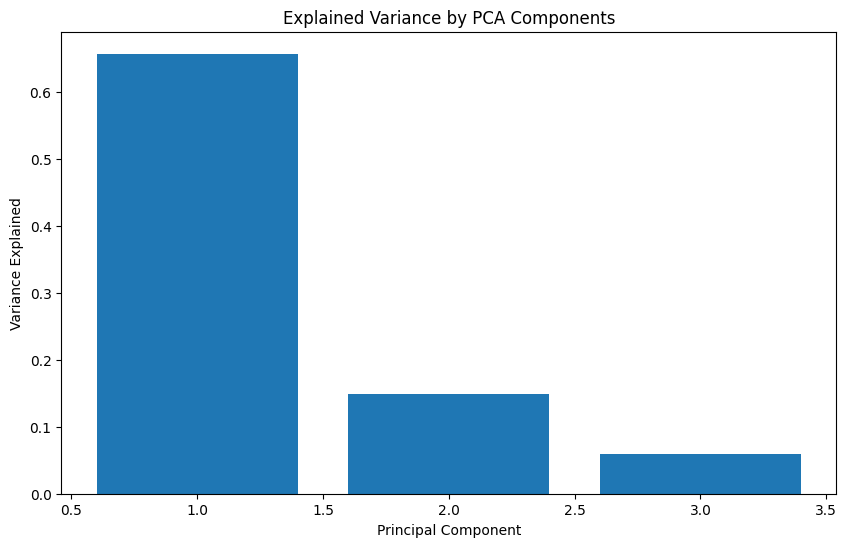

             unit_number  time_cycles  operational_setting_1  \
Component 1     0.001032     0.007801              -0.102575   
Component 2    -0.001194    -0.011708              -0.224330   
Component 3     0.005668    -0.015148              -0.556881   

             operational_setting_2  operational_setting_3  \
Component 1              -0.101754               0.002985   
Component 2              -0.217004               0.190884   
Component 3              -0.615855               0.395879   

             sensor_measurement_1  sensor_measurement_2  sensor_measurement_3  \
Component 1              0.213147              0.237186              0.240165   
Component 2              0.210632              0.051731             -0.030148   
Component 3             -0.135518             -0.075233             -0.035111   

             sensor_measurement_4  sensor_measurement_5  ...  \
Component 1              0.240104              0.209406  ...   
Component 2              0.016055            

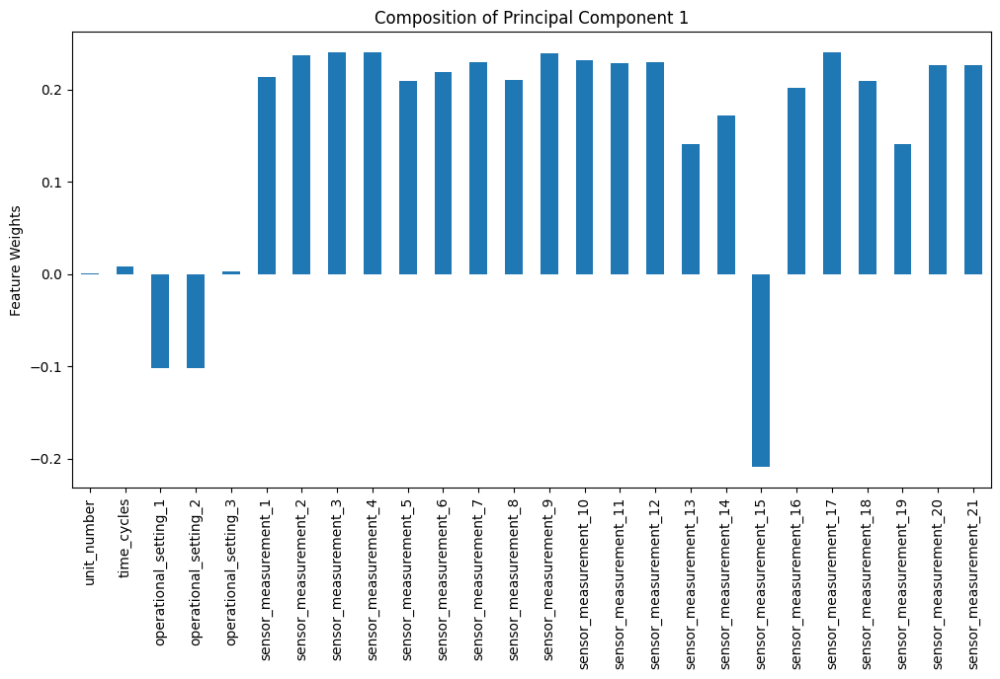

In [10]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_filtered is your DataFrame
X = df_filtered.drop('RUL', axis=1)
y = df_filtered['RUL']

# Standardizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applying PCA for 3 components
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# Plotting Explained Variance
plt.figure(figsize=(10,6))
plt.bar(range(1, 4), pca.explained_variance_ratio_)
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Explained Variance by PCA Components')
plt.show()

# Analyzing PCA Components
components = pd.DataFrame(pca.components_, columns=X.columns, index=[f'Component {i+1}' for i in range(3)])

# Displaying component makeup
print(components)

# Optionally, you can plot the makeup of a specific component
component_num = 1  # Change to the component number you're interested in
components_row = components.loc[f'Component {component_num}']
components_row.plot(kind='bar', figsize=(12,6))
plt.title(f'Composition of Principal Component {component_num}')
plt.ylabel('Feature Weights')
plt.show()


In [11]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import pandas as pd

# Assuming df_filtered is your DataFrame and it's already loaded in the environment
# And 'RUL' is the column you want to predict

# Separate features and target variable
X = df_filtered.drop('RUL', axis=1)
y = df_filtered['RUL']

# Split the data into training and testing sets for model validation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf_regressor.fit(X_train, y_train)

# Make predictions
y_pred = rf_regressor.predict(X_test)

# Calculate the Mean Squared Error for evaluation
mse = mean_squared_error(y_test, y_pred)

# Feature importances from the Random Forest Model
feature_importances = rf_regressor.feature_importances_

# Create a pandas series with feature importances
importances = pd.Series(feature_importances, index=X.columns)

# Sort the feature importances in descending order
sorted_importances = importances.sort_values(ascending=False)

print(sorted_importances)

time_cycles              0.661890
unit_number              0.104944
sensor_measurement_16    0.025058
sensor_measurement_11    0.022616
sensor_measurement_15    0.022004
sensor_measurement_14    0.018684
sensor_measurement_10    0.017542
sensor_measurement_1     0.012065
sensor_measurement_4     0.011973
operational_setting_1    0.010768
sensor_measurement_2     0.009199
sensor_measurement_9     0.009147
sensor_measurement_13    0.007133
sensor_measurement_19    0.006986
sensor_measurement_5     0.006634
operational_setting_2    0.006446
sensor_measurement_8     0.006082
sensor_measurement_18    0.005876
sensor_measurement_3     0.005619
sensor_measurement_17    0.005478
sensor_measurement_21    0.005066
sensor_measurement_20    0.004799
sensor_measurement_6     0.004644
sensor_measurement_7     0.003540
sensor_measurement_12    0.003535
operational_setting_3    0.002273
dtype: float64


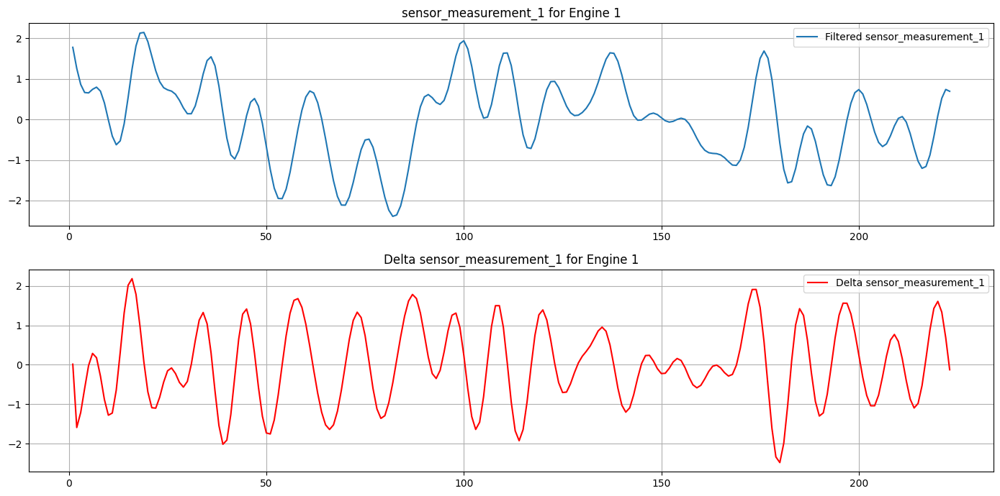

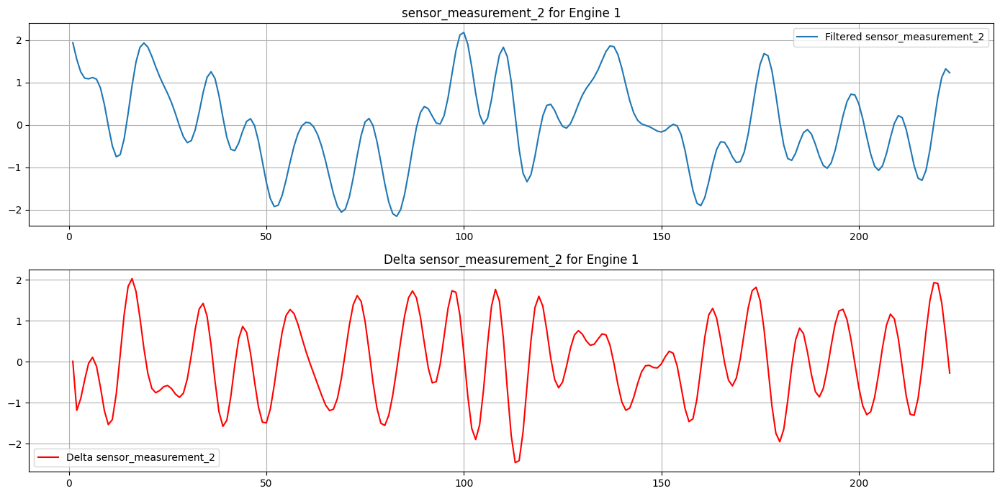

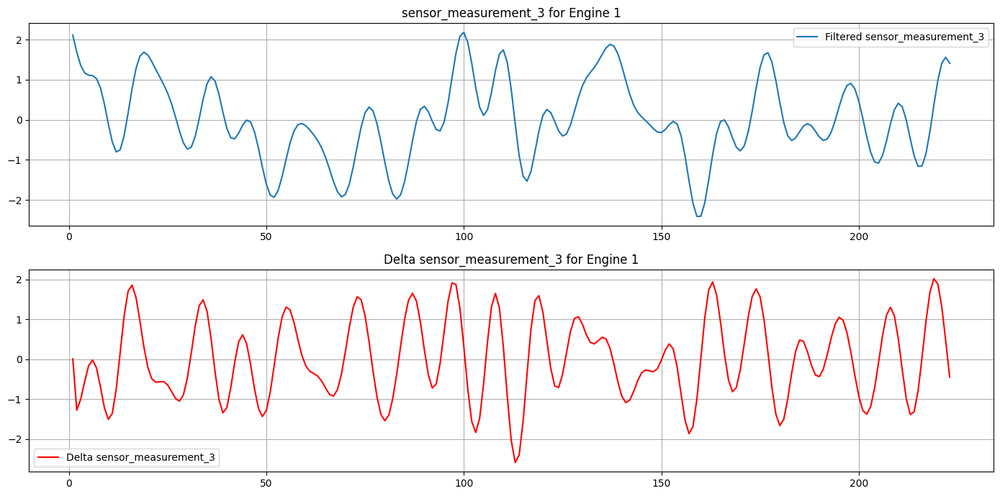

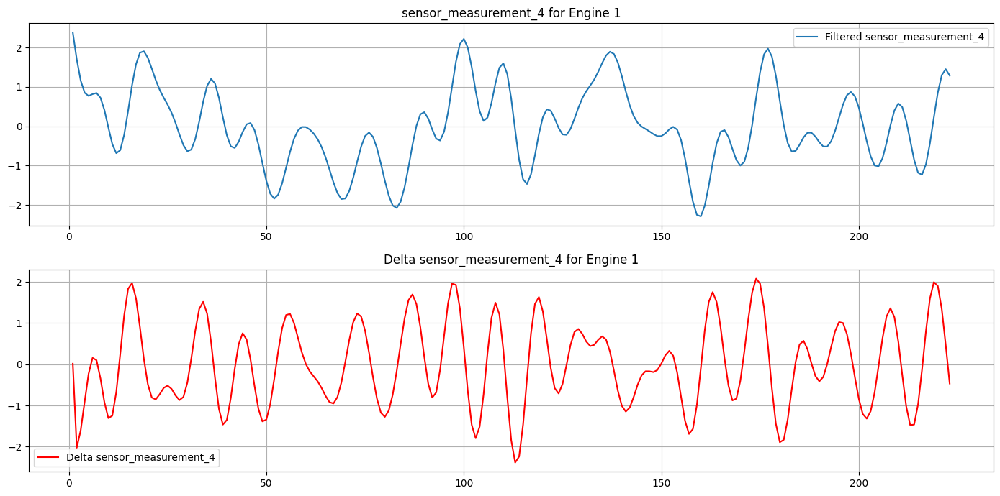

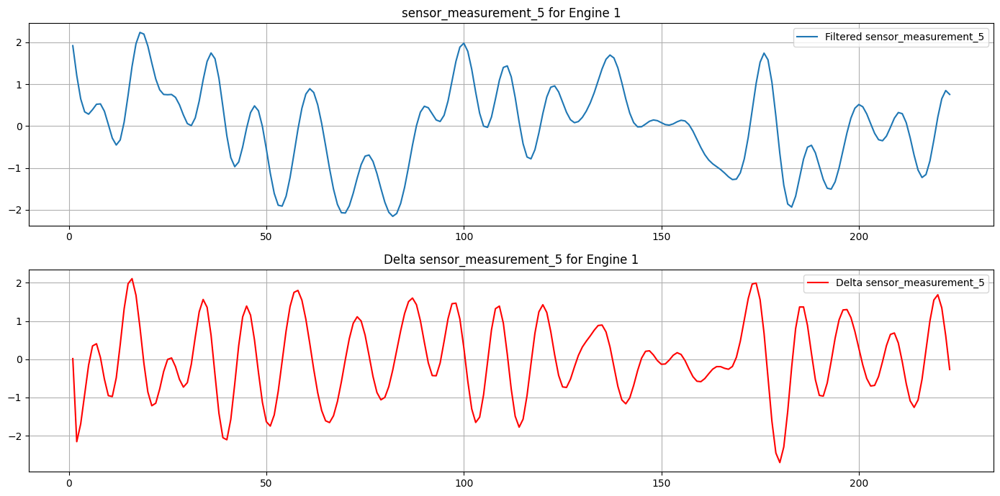

...

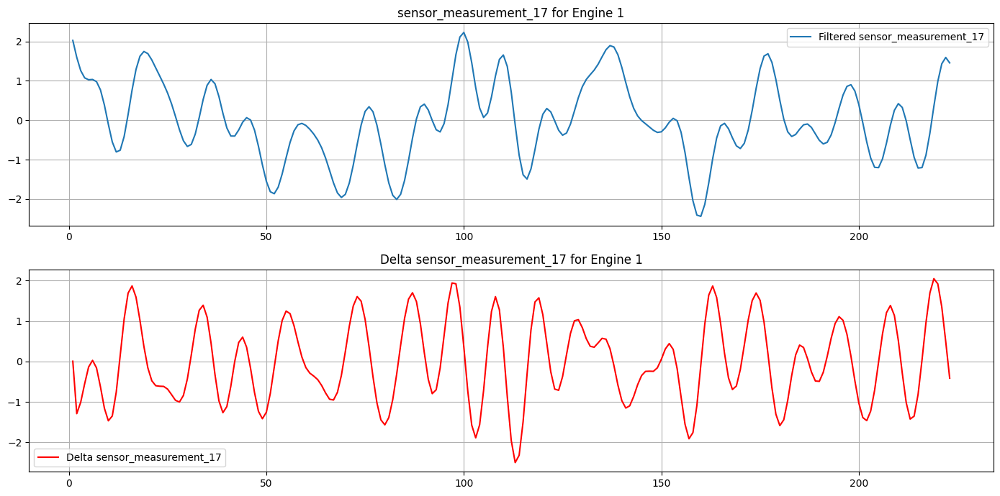

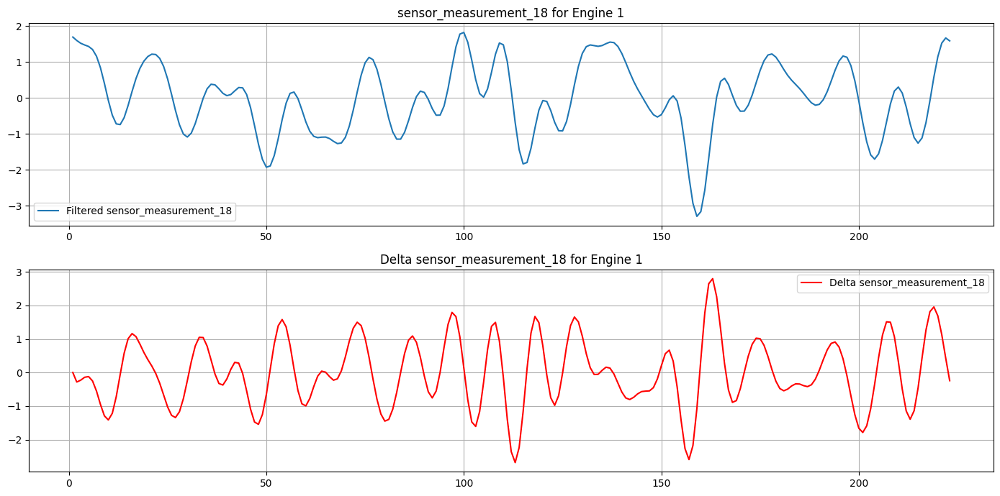

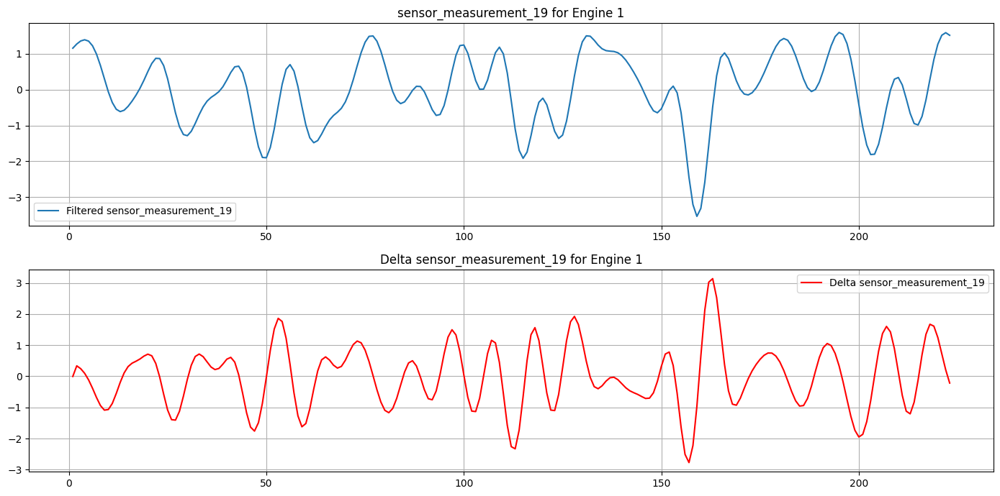

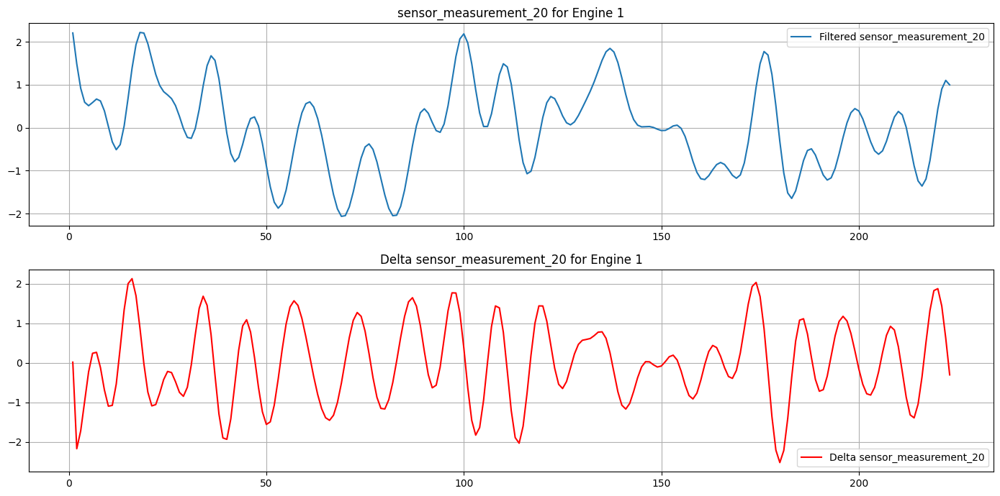

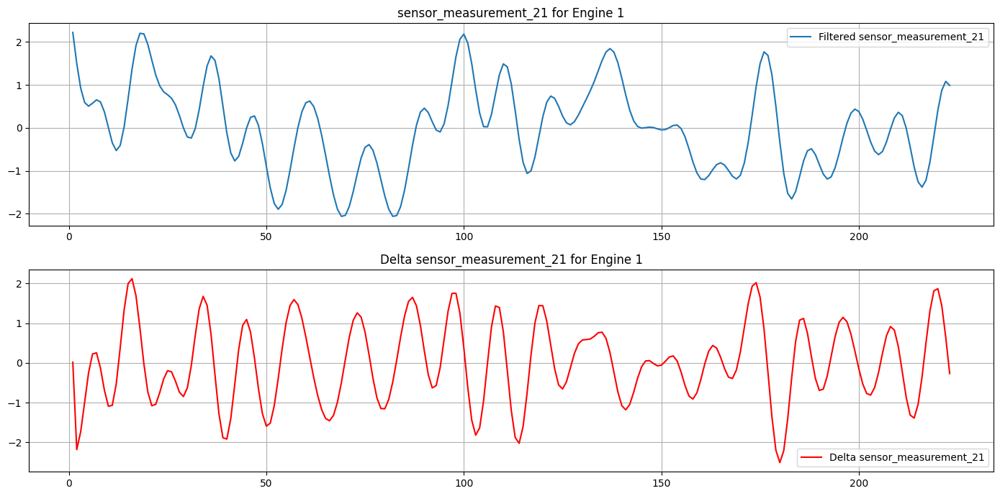

In [47]:
# ... [All your imports and filter functions as before]

# Load and filter the data
# ... [All your loading and filtering code as before]

# Generate delta columns for the filtered sensor signals
delta_columns = [f"delta_{col}" for col in sensor_columns]
for col, delta_col in zip(sensor_columns, delta_columns):
    df_filtered[delta_col] = df_filtered.groupby('unit_number')[col].diff().fillna(0)

# Normalize data - standardization
for col in sensor_columns + delta_columns:
    mean_std = df_filtered.groupby('unit_number')[col].transform(lambda x: (x - x.mean()) / x.std())
    df_filtered[col] = mean_std

# Plot the filtered signal data and the delta column for a specific engine unit
engine_unit_number = 1
df_engine_filtered = df_filtered[df_filtered['unit_number'] == engine_unit_number]

for sensor, delta_sensor in zip(sensor_columns, delta_columns):
    plt.figure(figsize=(14, 7))
    
    # Plot the filtered signal data
    plt.subplot(2, 1, 1)
    plt.plot(df_engine_filtered['time_cycles'], df_engine_filtered[sensor], label=f'Filtered {sensor}')
    plt.title(f'{sensor} for Engine {engine_unit_number}')
    plt.legend()
    plt.grid(True)
    
    # Plot the delta column
    plt.subplot(2, 1, 2)
    plt.plot(df_engine_filtered['time_cycles'], df_engine_filtered[delta_sensor], label=f'Delta {sensor}', color='red')
    plt.title(f'Delta {sensor} for Engine {engine_unit_number}')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()


In [ ]:

# The image  consists of two line plots, showcasing different aspects of sensor data for "Engine 1".

# Top Plot - Filtered Sensor Measurement for Engine 1:

# This plot displays the "Filtered sensor_measurement_19" for Engine 1 over time.
# The X-axis represents the time or sequence of measurements, while the Y-axis represents the values of the "Filtered sensor_measurement_19".
# The blue line graphically represents the readings of the filtered sensor measurement.
# The measurements appear to oscillate around zero, with some significant peaks and troughs. This indicates that the filtering process might have centered the data around zero, potentially removing a trend or offset.
# Bottom Plot - Delta Sensor Measurement for Engine 1:

# This plot shows the "Delta sensor_measurement_19" for Engine 1 over time.
# The X-axis is again the time or sequence of measurements, and the Y-axis shows the delta (change) values of the "sensor_measurement_19".
# The red line represents the changes or differences between consecutive readings of the sensor measurement.
# The data oscillates around zero, suggesting that there are both positive and negative changes in the measurements over time. Peaks represent sharp increases in sensor values, while troughs show sharp decreases.
# In essence, the top plot shows the filtered values of a sensor measurement over time, while the bottom plot visualizes the changes or differences in those measurements for Engine 1. The plots are essential for understanding both the absolute measurements and their rate of change, which can be critical for predictive maintenance and detecting anomalies.

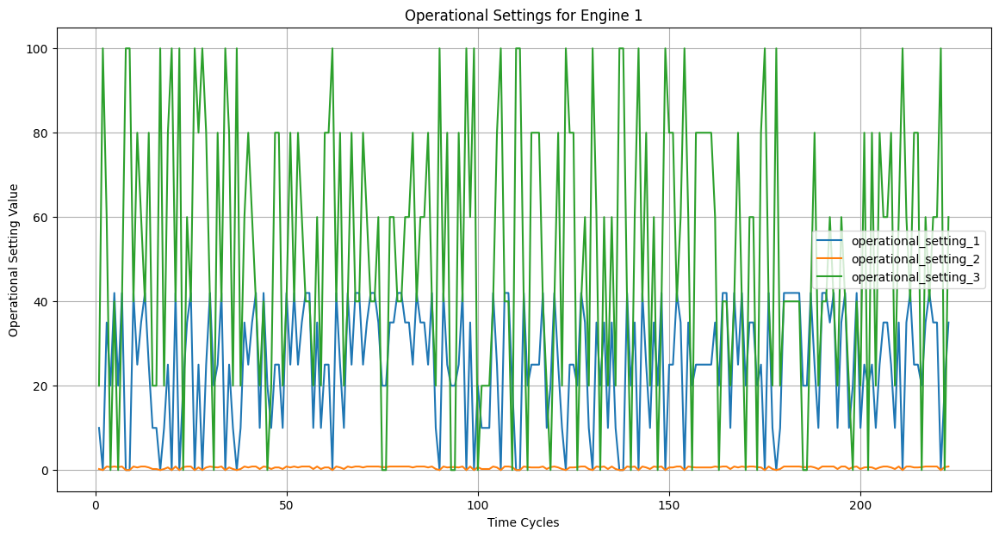

In [73]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_processed is the dataframe you are using
engine_unit_number = 1  # replace this with the desired engine unit number
df_engine = df_processed[df_processed['unit_number'] == engine_unit_number]

# Assuming your operational settings columns are named 'operational_setting_1', 'operational_setting_2', etc.
# If they have different names, you'll need to replace them accordingly
operational_settings_columns = ['operational_setting_1', 'operational_setting_2', 'operational_setting_3']  # add more as needed

# Plot the operational settings
plt.figure(figsize=(14, 7))

for setting in operational_settings_columns:
    plt.plot(df_engine['time_cycles'], df_engine[setting], label=setting)

plt.title(f'Operational Settings for Engine {engine_unit_number}')
plt.xlabel('Time Cycles')
plt.ylabel('Operational Setting Value')
plt.legend()
plt.grid(True)
plt.show()

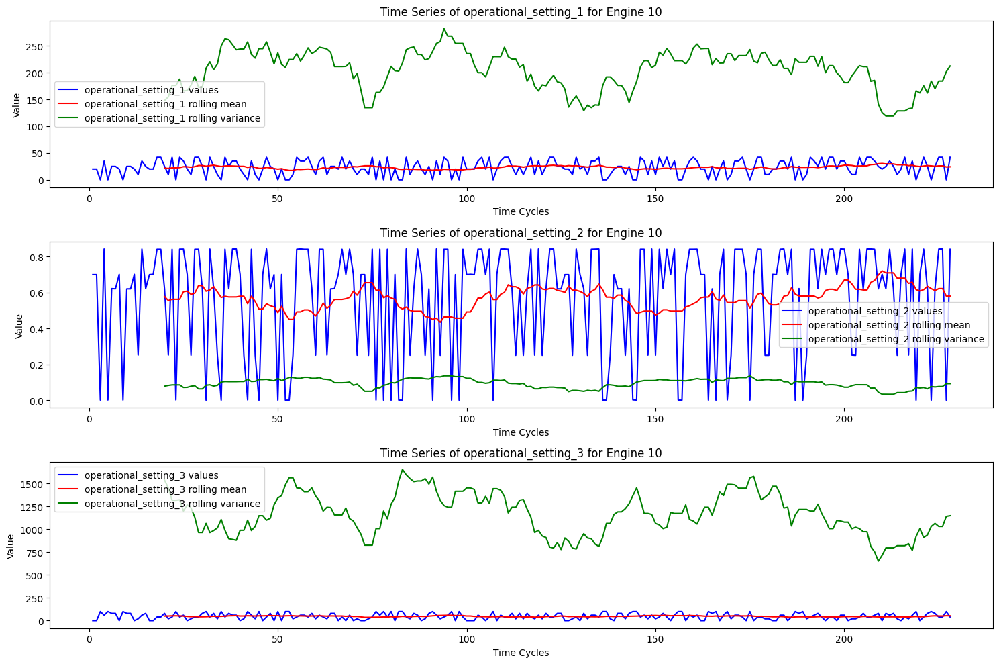

In [74]:
engine_unit_number = 10  # replace with desired engine unit number
df_engine = df_filtered[df_filtered['unit_number'] == engine_unit_number]

plt.figure(figsize=(15, 10))

operational_settings = ['operational_setting_1', 'operational_setting_2', 'operational_setting_3']

# Plot each operational setting and its rolling mean & variance
for idx, setting in enumerate(operational_settings, 1):
    plt.subplot(3, 1, idx)
    plt.plot(df_engine['time_cycles'], df_engine[setting], label=f'{setting} values', color='blue')
    
    # Compute and plot rolling mean
    rolling_mean = df_engine[setting].rolling(window=20).mean()  # window can be adjusted
    plt.plot(df_engine['time_cycles'], rolling_mean, label=f'{setting} rolling mean', color='red')
    
    # Compute and plot rolling variance
    rolling_var = df_engine[setting].rolling(window=20).std() ** 2
    plt.plot(df_engine['time_cycles'], rolling_var, label=f'{setting} rolling variance', color='green')
    
    plt.title(f'Time Series of {setting} for Engine {engine_unit_number}')
    plt.xlabel('Time Cycles')
    plt.ylabel('Value')
    plt.legend()
    plt.tight_layout()

plt.show()

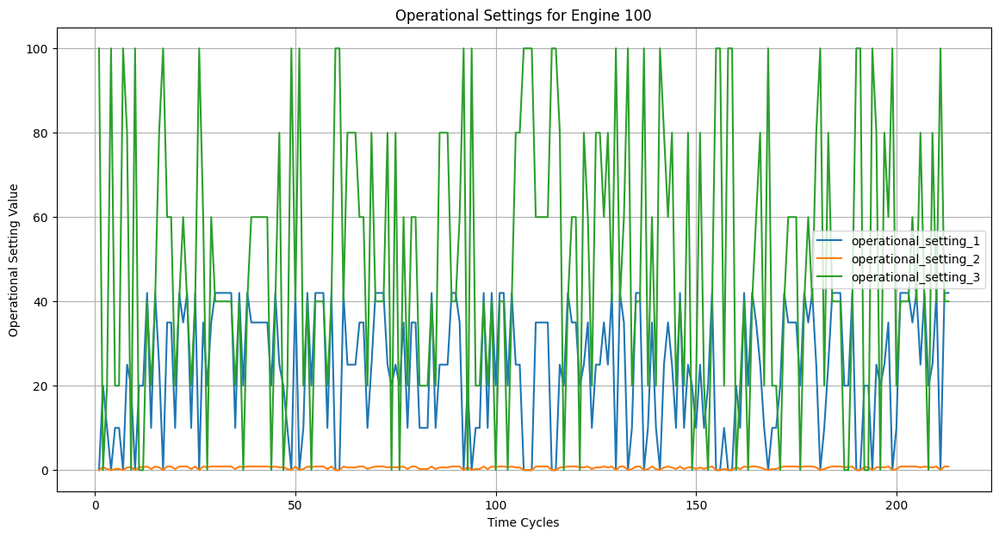

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_processed is the dataframe you are using
engine_unit_number = 100  # replace this with the desired engine unit number
df_engine = df_processed[df_processed['unit_number'] == engine_unit_number]

# Assuming your operational settings columns are named 'operational_setting_1', 'operational_setting_2', etc.
# If they have different names, you'll need to replace them accordingly
operational_settings_columns = ['operational_setting_1', 'operational_setting_2', 'operational_setting_3']  # add more as needed

# Plot the operational settings
plt.figure(figsize=(14, 7))

for setting in operational_settings_columns:
    plt.plot(df_engine['time_cycles'], df_engine[setting], label=setting)

plt.title(f'Operational Settings for Engine {engine_unit_number}')
plt.xlabel('Time Cycles')
plt.ylabel('Operational Setting Value')
plt.legend()
plt.grid(True)
plt.show()


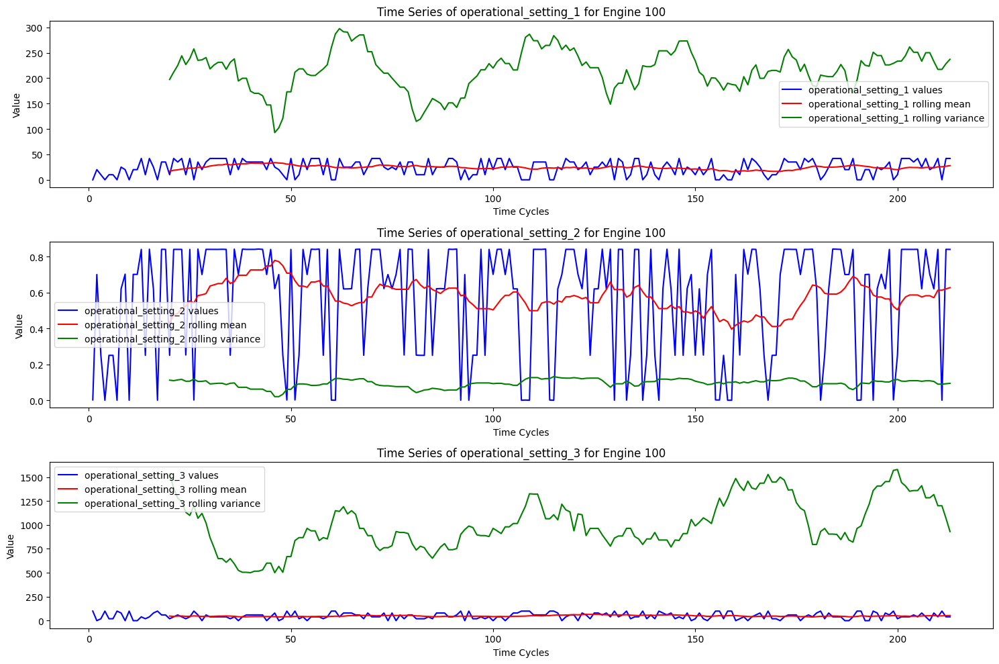

In [75]:
engine_unit_number = 100  # replace with desired engine unit number
df_engine = df_filtered[df_filtered['unit_number'] == engine_unit_number]

plt.figure(figsize=(15, 10))

operational_settings = ['operational_setting_1', 'operational_setting_2', 'operational_setting_3']

# Plot each operational setting and its rolling mean & variance
for idx, setting in enumerate(operational_settings, 1):
    plt.subplot(3, 1, idx)
    plt.plot(df_engine['time_cycles'], df_engine[setting], label=f'{setting} values', color='blue')
    
    # Compute and plot rolling mean
    rolling_mean = df_engine[setting].rolling(window=20).mean()  # window can be adjusted
    plt.plot(df_engine['time_cycles'], rolling_mean, label=f'{setting} rolling mean', color='red')
    
    # Compute and plot rolling variance
    rolling_var = df_engine[setting].rolling(window=20).std() ** 2
    plt.plot(df_engine['time_cycles'], rolling_var, label=f'{setting} rolling variance', color='green')
    
    plt.title(f'Time Series of {setting} for Engine {engine_unit_number}')
    plt.xlabel('Time Cycles')
    plt.ylabel('Value')
    plt.legend()
    plt.tight_layout()

plt.show()

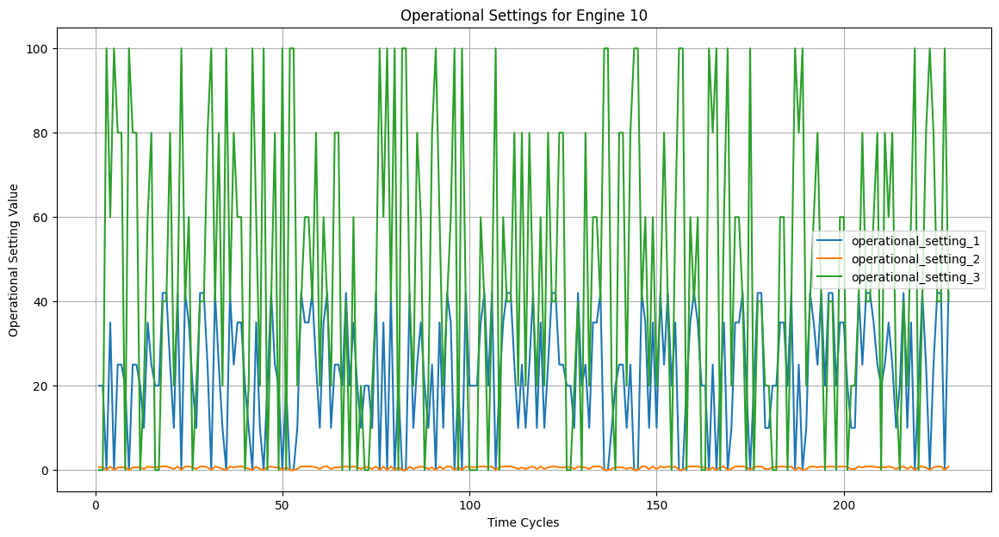

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_processed is the dataframe you are using
engine_unit_number = 10  # replace this with the desired engine unit number
df_engine = df_processed[df_processed['unit_number'] == engine_unit_number]

# Assuming your operational settings columns are named 'operational_setting_1', 'operational_setting_2', etc.
# If they have different names, you'll need to replace them accordingly
operational_settings_columns = ['operational_setting_1', 'operational_setting_2', 'operational_setting_3']  # add more as needed

# Plot the operational settings
plt.figure(figsize=(14, 7))

for setting in operational_settings_columns:
    plt.plot(df_engine['time_cycles'], df_engine[setting], label=setting)

plt.title(f'Operational Settings for Engine {engine_unit_number}')
plt.xlabel('Time Cycles')
plt.ylabel('Operational Setting Value')
plt.legend()
plt.grid(True)
plt.show()

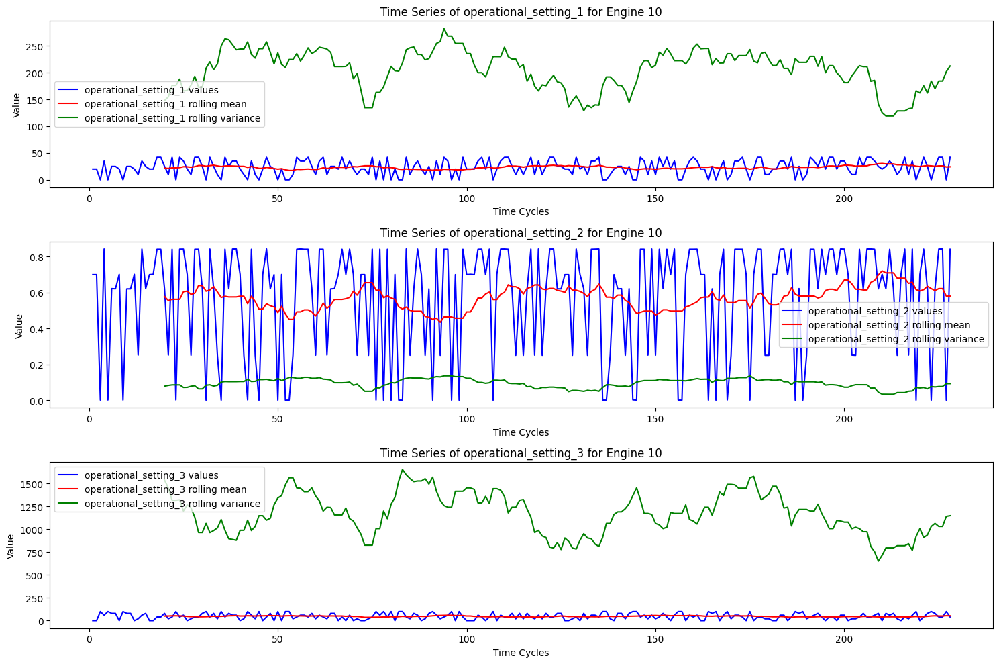

In [78]:
engine_unit_number = 10  # replace with desired engine unit number
df_engine = df_filtered[df_filtered['unit_number'] == engine_unit_number]

plt.figure(figsize=(15, 10))

operational_settings = ['operational_setting_1', 'operational_setting_2', 'operational_setting_3']

# Plot each operational setting and its rolling mean & variance
for idx, setting in enumerate(operational_settings, 1):
    plt.subplot(3, 1, idx)
    plt.plot(df_engine['time_cycles'], df_engine[setting], label=f'{setting} values', color='blue')
    
    # Compute and plot rolling mean
    rolling_mean = df_engine[setting].rolling(window=20).mean()  # window can be adjusted
    plt.plot(df_engine['time_cycles'], rolling_mean, label=f'{setting} rolling mean', color='red')
    
    # Compute and plot rolling variance
    rolling_var = df_engine[setting].rolling(window=20).std() ** 2
    plt.plot(df_engine['time_cycles'], rolling_var, label=f'{setting} rolling variance', color='green')
    
    plt.title(f'Time Series of {setting} for Engine {engine_unit_number}')
    plt.xlabel('Time Cycles')
    plt.ylabel('Value')
    plt.legend()
    plt.tight_layout()

plt.show()

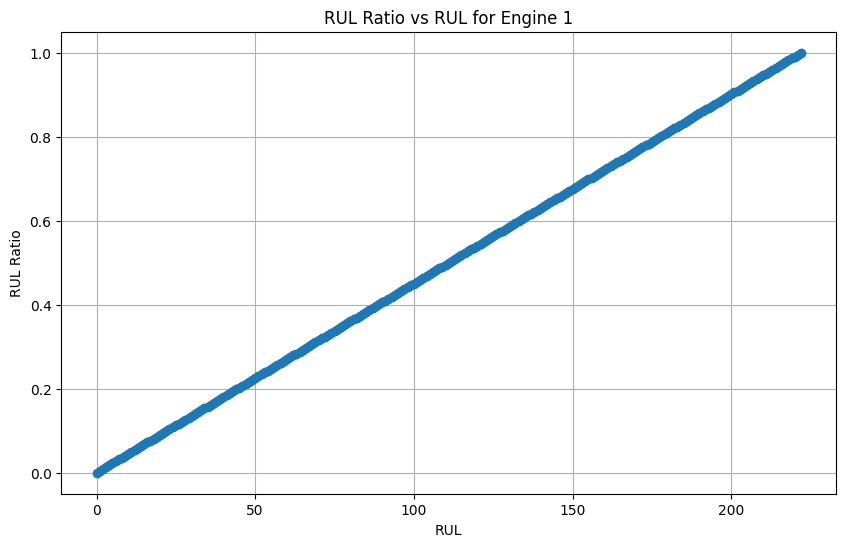

In [56]:
# Grouping by engine_id and getting the max RUL for each engine
max_rul_by_engine = df_filtered.groupby('unit_number')['RUL'].max()

# Calculate RUL ratios using a lambda function
df_filtered['RUL_ratio'] = df_filtered.apply(lambda row: row['RUL'] / max_rul_by_engine[row['unit_number']], axis=1)
import matplotlib.pyplot as plt

# Assuming you want to plot for engine_id = 1 (change this to the desired engine ID)
engine_data = df_filtered[df_filtered['unit_number'] == 1]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(engine_data['RUL'], engine_data['RUL_ratio'], '-o')
plt.xlabel('RUL')
plt.ylabel('RUL Ratio')
plt.title('RUL Ratio vs RUL for Engine 1')
plt.grid(True)
plt.show()



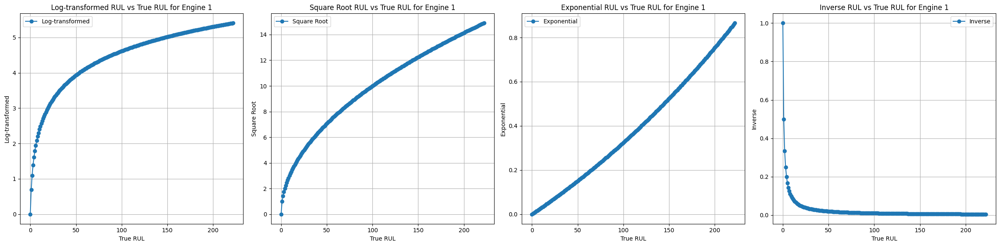

In [12]:

# import numpy as np
# import matplotlib.pyplot as plt

# # Calculate the log-transformed RUL for each row
# df_filtered['log_RUL'] = np.log1p(df_filtered['RUL'])

# # Compute other transformations for all engines
# df_filtered['sqrt_RUL'] = np.sqrt(df_filtered['RUL'])
# df_filtered['exp_RUL'] = np.exp(df_filtered['RUL'] / df_filtered['RUL'].max()) - 1
# df_filtered['inverse_RUL'] = 1 / (df_filtered['RUL'] + 1)

# # Filter data for Engine 1 and Engine 2
# engine1_data = df_filtered[df_filtered['unit_number'] == 1]
# engine2_data = df_filtered[df_filtered['unit_number'] == 2]

# # Plotting for Engine 1
# plt.figure(figsize=(24, 6))

# transformations = ['log_RUL', 'sqrt_RUL', 'exp_RUL', 'inverse_RUL']
# titles = ['Log-transformed', 'Square Root', 'Exponential', 'Inverse']

# for i, transformation in enumerate(transformations):
#     plt.subplot(2, 4, i + 1)
#     plt.plot(engine1_data['RUL'], engine1_data[transformation], label=titles[i], marker='o', linestyle='-')
#     plt.xlabel('True RUL')
#     plt.ylabel(titles[i])
#     plt.title(f'{titles[i]} RUL vs True RUL for Engine 1')
#     plt.grid(True)
#     plt.legend()

# # Plotting for Engine 2
# for i, transformation in enumerate(transformations):
#     plt.subplot(2, 4, i + 5)
#     plt.plot(engine2_data['RUL'], engine2_data[transformation], label=titles[i], marker='o', linestyle='-')
#     plt.xlabel('True RUL')
#     plt.ylabel(titles[i])
#     plt.title(f'{titles[i]} RUL vs True RUL for Engine 2')
#     plt.grid(True)
#     plt.legend()

# plt.tight_layout()
# plt.show()
# Calculate the log-transformed RUL for each row
df_filtered['log_RUL'] = np.log1p(df_filtered['RUL'])

# Compute other transformations for all engines
df_filtered['sqrt_RUL'] = np.sqrt(df_filtered['RUL'])
df_filtered['exp_RUL'] = np.exp(df_filtered['RUL'] / df_filtered['RUL'].max()) - 1
df_filtered['inverse_RUL'] = 1 / (df_filtered['RUL'] + 1)

# Filter data for Engine 1
engine1_data = df_filtered[df_filtered['unit_number'] == 1]

# Plotting for Engine 1
plt.figure(figsize=(24, 6))

transformations = ['log_RUL', 'sqrt_RUL', 'exp_RUL', 'inverse_RUL']
titles = ['Log-transformed', 'Square Root', 'Exponential', 'Inverse']

for i, transformation in enumerate(transformations):
    plt.subplot(1, 4, i + 1)
    plt.plot(engine1_data['RUL'], engine1_data[transformation], label=titles[i], marker='o', linestyle='-')
    plt.xlabel('True RUL')
    plt.ylabel(titles[i])
    plt.title(f'{titles[i]} RUL vs True RUL for Engine 1')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()

In [80]:
# import pandas as pd

# # Assuming df_filtered exists and has columns like 'engine_id' and 'operational_setting_1', 'operational_setting_2', 'operational_setting_3'

# # Define the window size for rolling calculations. Adjust this according to your needs.
# window_size = 5

# # List of operational settings
# settings = ['operational_setting_1', 'operational_setting_2', 'operational_setting_3']

# # Loop through each engine
# for engine_id in df_filtered['unit_number'].unique():
    
#     # Filter dataframe for the specific engine
#     engine_data = df_filtered[df_filtered['unit_number'] == engine_id].copy()

#     # Calculate rolling mean and variance for each operational setting
#     for setting in settings:
#         rolling_mean_col = f"{setting}_rolling_mean"
#         rolling_var_col = f"{setting}_rolling_variance"
        
#         engine_data[rolling_mean_col] = engine_data[setting].rolling(window=window_size).mean()
#         engine_data[rolling_var_col] = engine_data[setting].rolling(window=window_size).var()

#         # Update df_filtered with the calculated values
#         df_filtered.update(engine_data[[rolling_mean_col, rolling_var_col]])
window_size = 10  # Adjust as needed

# Calculate rolling mean and variance for each operational setting
for i in [1, 2, 3]:
    df_filtered[f'operational_setting_{i}_rolling_mean'] = df_filtered.groupby('unit_number')[f'operational_setting_{i}'].transform(lambda x: x.rolling(window=window_size).mean())
    df_filtered[f'operational_setting_{i}_rolling_variance'] = df_filtered.groupby('unit_number')[f'operational_setting_{i}'].transform(lambda x: x.rolling(window=window_size).var())


print(df_filtered.columns)

Index(['unit_number', 'time_cycles', 'operational_setting_1',
       'operational_setting_2', 'operational_setting_3',
       'sensor_measurement_1', 'sensor_measurement_2', 'sensor_measurement_3',
       'sensor_measurement_4', 'sensor_measurement_5', 'sensor_measurement_6',
       'sensor_measurement_7', 'sensor_measurement_8', 'sensor_measurement_9',
       'sensor_measurement_10', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_16', 'sensor_measurement_17',
       'sensor_measurement_18', 'sensor_measurement_19',
       'sensor_measurement_20', 'sensor_measurement_21', 'RUL',
       'delta_sensor_measurement_1', 'delta_sensor_measurement_2',
       'delta_sensor_measurement_3', 'delta_sensor_measurement_4',
       'delta_sensor_measurement_5', 'delta_sensor_measurement_6',
       'delta_sensor_measurement_7', 'delta_sensor_measurement_8',
       'delta_sensor_measur

In [82]:
df_filtered.to_csv("C:\\Users\\ssen\\Documents\\FlexKI\\EngineHealthPred\\ChallengeData\\final_processed.csv")